In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull

import seir_discrete
import switch

%load_ext autoreload
%autoreload 2

In [22]:
folder = 'full_chel'
# recalc beta!
for i in range(30):
    df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv', 
                sep='\t')
    df_b.beta_H1N1 = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
    #df_b.to_csv(f'{folder}_recalc/seirb_seed_{i}.csv', index=False)

In [60]:
folder = 'sampled_200k'
# recalc beta!
for i in range(30):
    df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv', 
                sep='\t')
    df_b.beta_H1N1 = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
    df_b.to_csv(f'{folder}_recalc/seirb_seed_{i}.csv', index=False)

In [233]:
folder = 'chelyabinsk_10_res_10i'
# recalc beta!
for i in range(3):
    df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv', 
                sep='\t')
    df_b.beta_H1N1 = - (df_b.S_H1N1.diff() / (df_b.S_H1N1 * df_b.I_H1N1)).fillna(0)
    df_b.to_csv(f'{folder}_recalc/seirb_seed_{i}.csv', index=False)

In [4]:
sigma=1/2
gamma=1/6

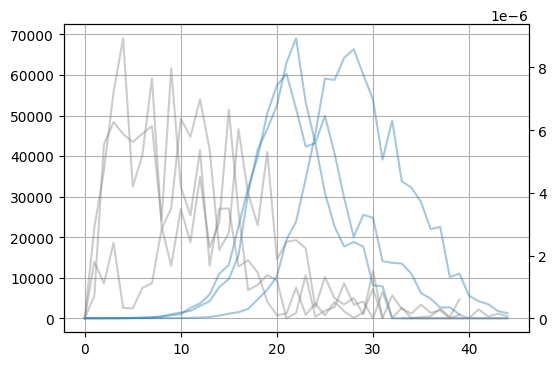

In [237]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()
folder = 'chelyabinsk_10_res_10i_recalc'
for i in range(3):
    df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')
    if df_b['I_H1N1'].max() < 1000:
        print(i, df_b['I_H1N1'].max())
        
    else:
        fin = df_b.shape[0]#df_b[df_b['I_H1N1']==0].index[0]
        ax.plot(df_b.I_H1N1[:fin], color='tab:blue', alpha=0.4)
        beta = df_b.beta_H1N1[:fin]
        ax_beta.plot(beta, color='gray', alpha=0.4, label='beta from df')
    
ax.grid()

In [7]:
folder = 'chelyabinsk_10_res_recalc'

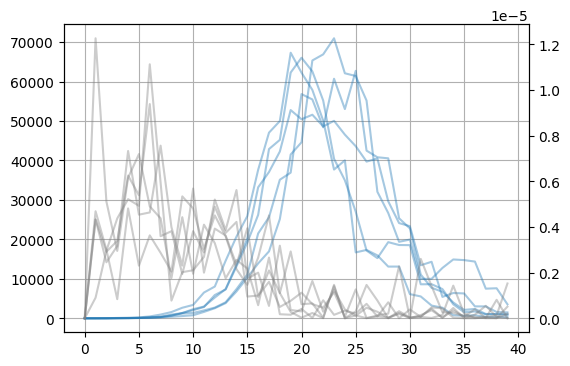

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

for i in range(5):
    df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')
    if df_b['I_H1N1'].max() < 1000:
        print(i, df_b['I_H1N1'].max())
        
    else:
        fin = df_b.shape[0]#df_b[df_b['I_H1N1']==0].index[0]
        ax.plot(df_b.I_H1N1[:fin], color='tab:blue', alpha=0.4)

        beta = df_b.beta_H1N1[:fin]
        ax_beta.plot(beta, color='gray', alpha=0.4, label='beta from df')
    
    
ax.grid()

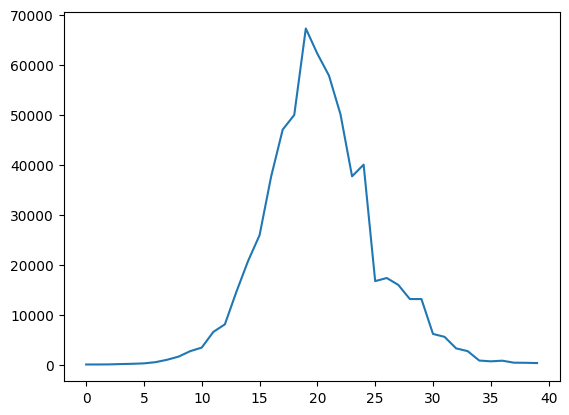

In [10]:
i = 0
df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')

plt.plot(df_b.I_H1N1)
#plt.plot(df_b.I_H1N1 + df_b.E_H1N1, ls=':')

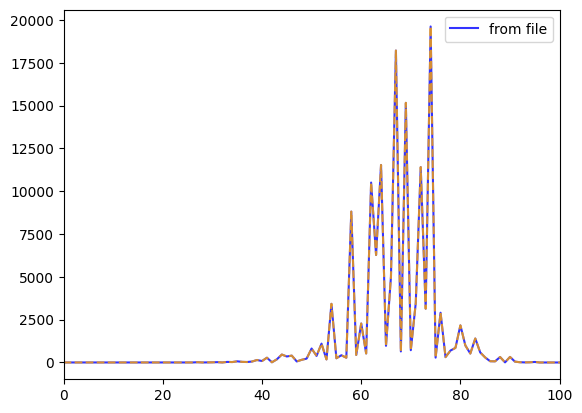

In [259]:
# просто из компартментов не получится сделать, 
# тк для incidence нужны Exposed только на 1-м дне заболевания! 
# А в df_b люди в компартменте Exposed на 1-м И 2-м днях заболевания

calc_diff = df_b.E_H1N1.diff()#(df_b.I_H1N1 + df_b.E_H1N1).diff()
calc_diff[calc_diff<0] = 0

calc_diff_sum = (df_b.I_H1N1 + df_b.E_H1N1).diff()
calc_diff_sum[calc_diff_sum<0] = 0


#plt.plot(calc_diff, label='diff Exposed', ls=':', color='red')
#plt.plot(calc_diff_sum, color='green', ls=':', label='diff (Exposed+Infected)')
plt.plot(inc, ls='-', label='from file', alpha=0.8, color='blue')
plt.xlim(0,100)
plt.plot((-df_b.S_H1N1.diff() - df_b.E_H1N1.diff()).shift(-2), alpha=0.8, 
         ls='--', color='orange')
plt.legend();

In [253]:
(-df_b.S_H1N1.diff() - df_b.E_H1N1.diff()).shift(-1)

0      0.0
1      1.0
2      1.0
3      1.0
4     -0.0
      ... 
244   -0.0
245   -0.0
246   -0.0
247   -0.0
248    NaN
Length: 249, dtype: float64

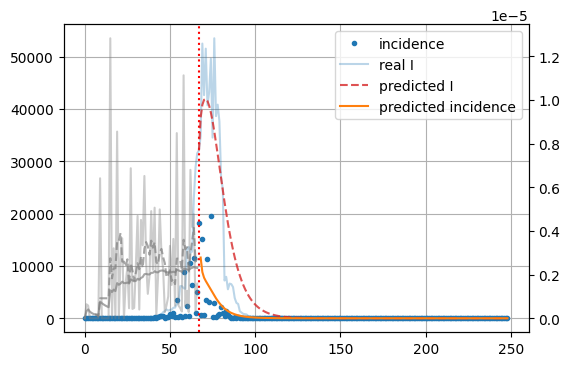

In [273]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')
inc = pd.read_csv(f'{folder}/incidence_seed_{i}.csv', sep='\t')['H1N1']

fin = df_b.shape[0]
st_day = 67
ax.plot(inc, marker='.', ls='', label='incidence')
ax.plot(df_b.I_H1N1, color='tab:blue', alpha=0.3, label='real I')

betas = df_b.beta_H1N1[:st_day]
beta_exp = betas[:st_day].expanding().mean()
beta_roll = betas[:st_day].rolling(7).mean()

ax_beta.plot(betas[:st_day], color='gray', alpha=0.4, label='beta from df')
ax_beta.plot(beta_exp, color='gray',  label='beta exp', alpha=0.7)
ax_beta.plot(beta_roll, color='gray',  label='beta roll', alpha=0.7, ls='--')


ax.axvline(st_day, ls=':', color='red')

y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)

beta_val = beta_exp.values[-1]
col = 'tab:red'
lab = 'SEIR I (exp.mean beta)'

S,E,I,R = seir_discrete.seir_model(y0, ts, beta_val, 
                                   sigma, gamma, stype='d', 
                                   beta_t=False).T
seir_inc = np.diff(I)
seir_inc[seir_inc<0] = 0
ax.plot(ts+st_day, I, color=col, ls='--', alpha=0.8, label='predicted I')
#ax.plot(ts[1:]+st_day, seir_inc, color=col, ls='-', alpha=0.8, label='predicted I .diff()')
ax.plot(ts[1:]+st_day, (-np.diff(S) - np.diff(E)), label='predicted incidence')

ax.legend()                 
ax.grid()

In [272]:
inc.argmax()

74

In [130]:
def cpoint_perc_people(seed_df, perc=0.01, popul=200000):
    the_day = seed_df[seed_df.I_H1N1 >= popul*perc].index
    if the_day.shape[0]:
        return the_day[0]
    else:
        return -1

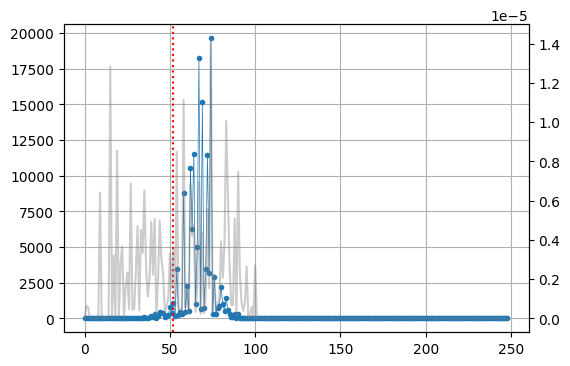

In [193]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')
inc = pd.read_csv(f'{folder}/incidence_seed_{i}.csv', sep='\t')['H1N1']
seed_df = df_b.copy()


ax.plot(inc, marker='.', ls='-', lw=0.5)
ax_beta.plot(seed_df.beta_H1N1, color='gray', alpha=0.4)
ax.axvline(cpoint_perc_people(seed_df, perc=0.01), ls=':', color='red')
ax.grid()

## plots for 1, 5, 10% for beta from switch, beta from 0

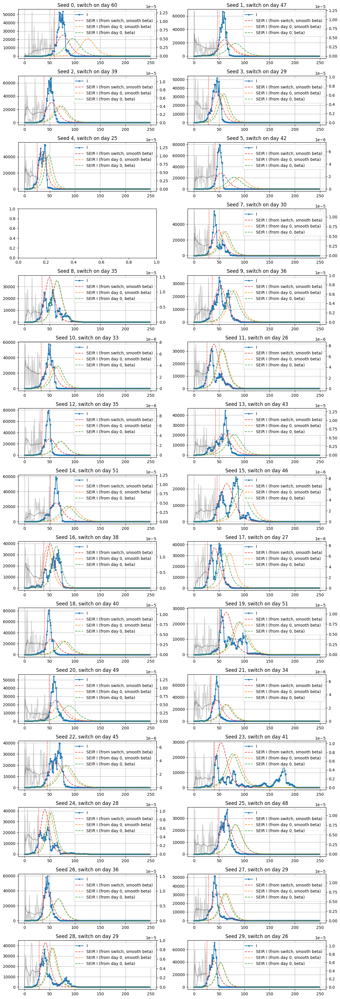

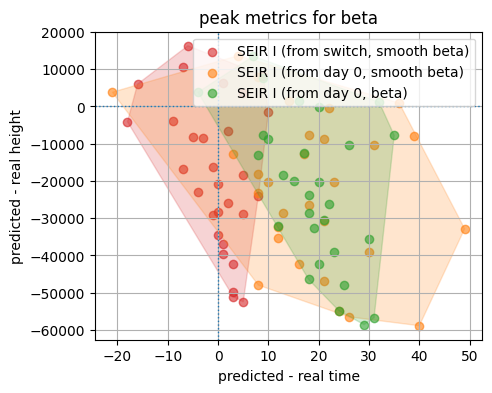

In [153]:
res = switch.plot_hybrid_3(switch_method='frac_people', perc=0.05)

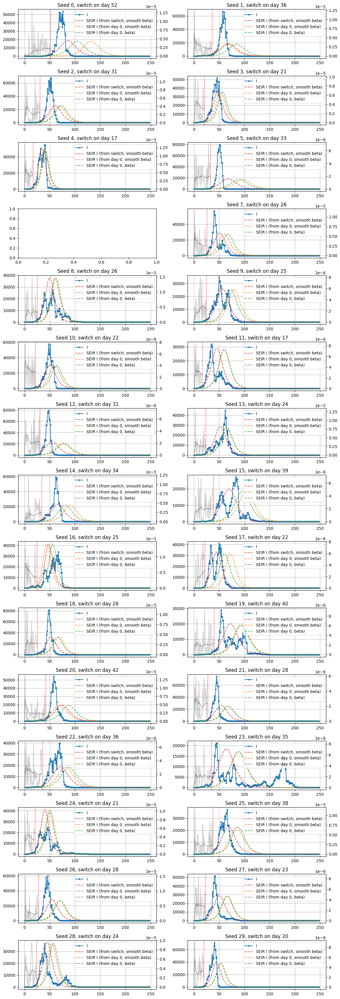

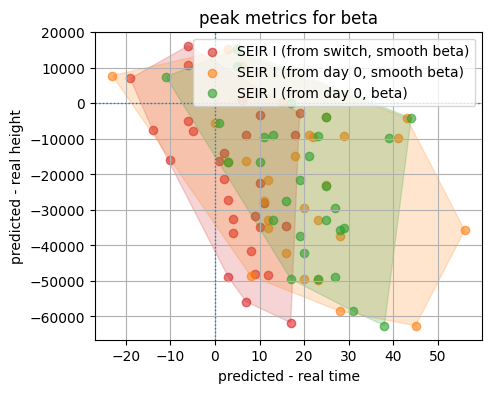

In [154]:
res1 = switch.plot_hybrid_3(switch_method='frac_people', perc=0.01)

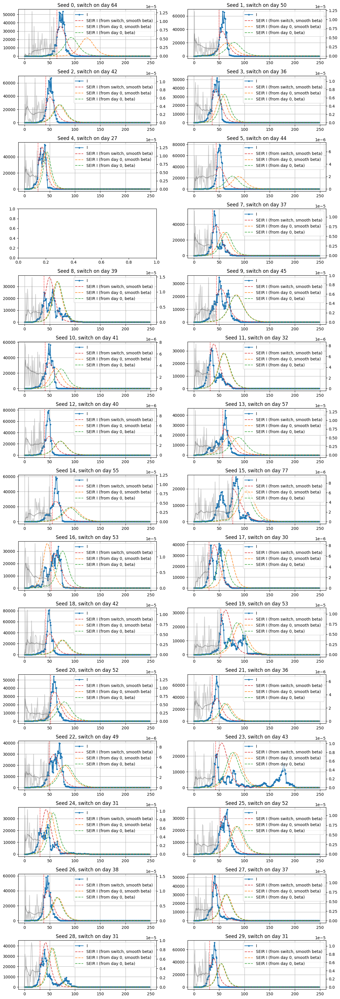

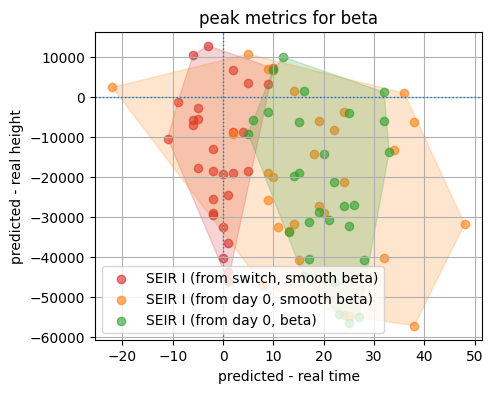

In [155]:
res10 = switch.plot_hybrid_3(switch_method='frac_people', perc=0.1,
                          beta_type='expanding')

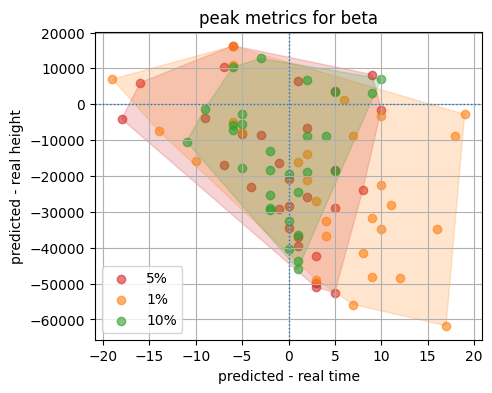

In [156]:
switch.plot_peaks_area(pts=[i[0][0] for i in [res,res1,res10]], 
                       phs=[i[1][0] for i in [res,res1,res10]],
                       labels=['5%', '1%', '10%'])

## plots for 1, 5, 10% for 3 beta types

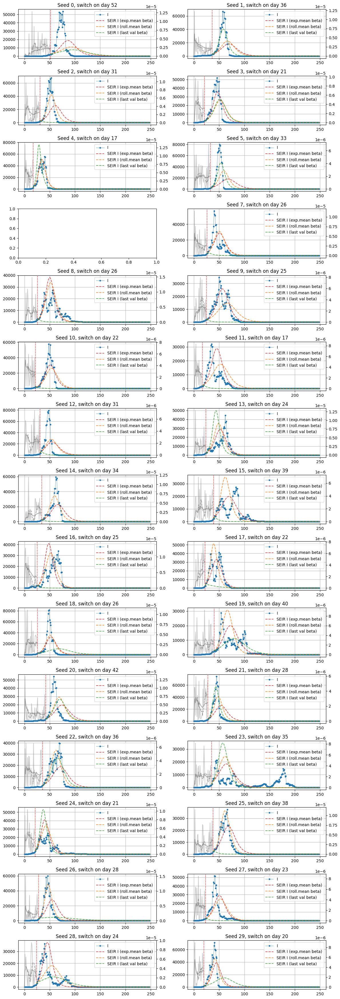

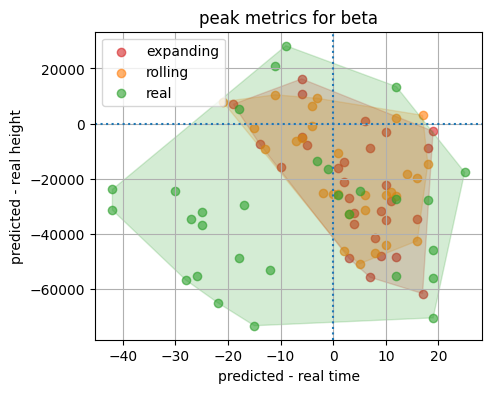

In [167]:
res_types_1 = switch.plot_hybrid(switch_method='frac_people', perc=0.01,
                                  plot_traj=True)

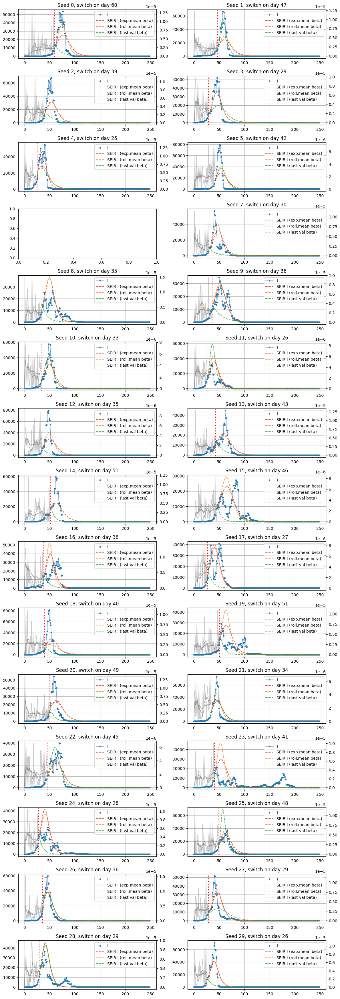

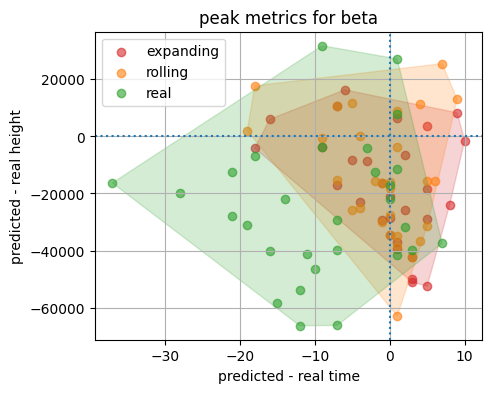

In [168]:
res_types_5 = switch.plot_hybrid(switch_method='frac_people', perc=0.05,
                                  plot_traj=True)

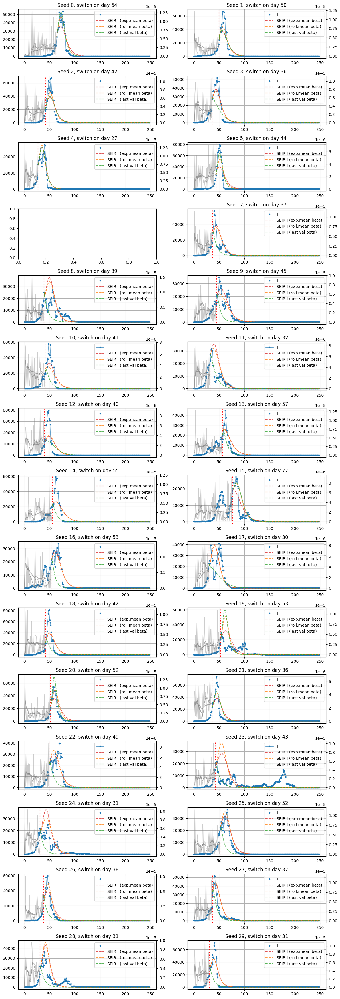

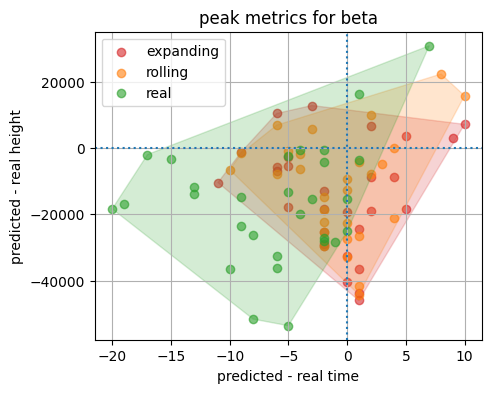

In [169]:
res_types_10 = switch.plot_hybrid(switch_method='frac_people', perc=0.1,
                                  plot_traj=True)

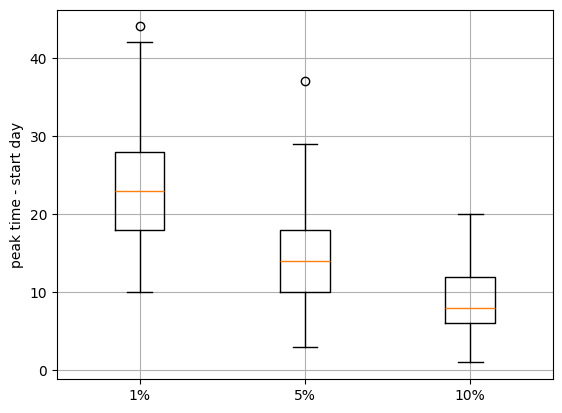

In [171]:
boxes = [np.array(res_df[3]) - np.array(res_df[2]) for res_df in 
                                                     [res_types_1, 
                                                      res_types_5, 
                                                      res_types_10]]
plt.boxplot(boxes)
plt.xticks(np.arange(1,4), ['1%', '5%', '10%'])
plt.ylabel('peak time - start day')
plt.grid();

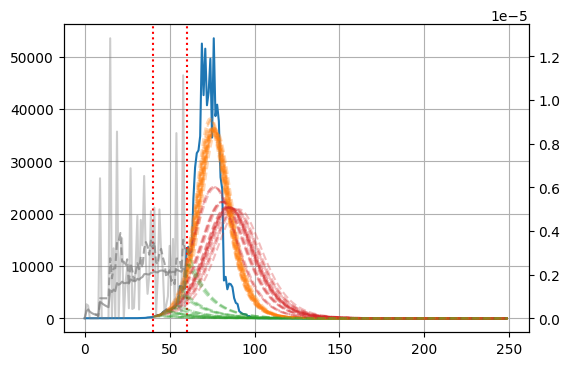

In [394]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')


fin = 250
first = 40
last = 60
ax.plot(df_b.I_H1N1)

betas = df_b.beta_H1N1[:last]
beta_exp = betas[:last].expanding().mean()
beta_roll = betas[:last].rolling(7).mean()

ax_beta.plot(betas, color='gray', alpha=0.4, label='beta from df')
ax_beta.plot(beta_exp, color='gray',  label='beta exp', alpha=0.7)
ax_beta.plot(beta_roll, color='gray',  label='beta roll', alpha=0.7, ls='--')



ax.axvline(first, ls=':', color='red')
ax.axvline(last, ls=':', color='red')

for st_day in range(first,last+1):
    y0 = df_b.iloc[st_day,:4].values
    ts = np.arange(fin-st_day)
    for beta_val, pt_l, ph_l, col, lab in zip([beta_exp.values[-1], 
                                                 beta_roll.values[-1],
                                                 betas.values[-1]],
                                               [pt_1,pt_2,pt_3], [ph_1,ph_2,ph_3],
                                               ['tab:red','tab:orange','tab:green'],
                                               ['SEIR I (exp.mean beta)',
                                                'SEIR I (roll.mean beta)',
                                                'SEIR I (last val beta)']):
        S,E,I,R = seir_discrete.seir_model(y0, ts, beta_val, 
                                           sigma, gamma, stype='d', 
                                           beta_t=False).T

        ax.plot(ts+st_day, I, color=col, ls='--', alpha=0.3, label=lab)
                    
                    
ax.grid()

In [202]:
df_b.I_H1N1.argmax()

76

## constant betas

In [11]:
#folder = 'sampled_200k_res_recalc'

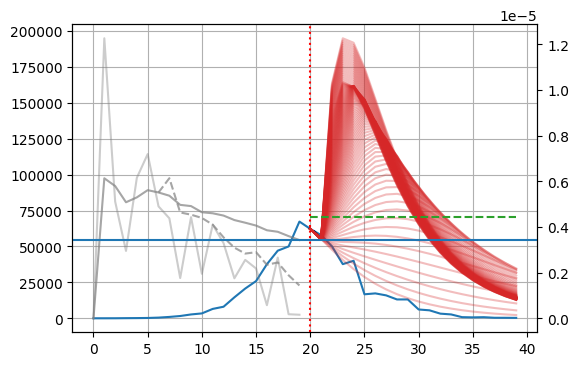

In [13]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')


fin = df_b.shape[0]
st_day = 20
ax.plot(df_b.I_H1N1)

betas = df_b.beta_H1N1[:st_day]
beta_exp = betas[:st_day].expanding().mean()
beta_roll = betas[:st_day].rolling(7).mean()

ax_beta.plot(betas[:st_day], color='gray', alpha=0.4, label='beta from df')
ax_beta.plot(beta_exp, color='gray',  label='beta exp', alpha=0.7)
ax_beta.plot(beta_roll, color='gray',  label='beta roll', alpha=0.7, ls='--')



ax.axvline(st_day, ls=':', color='red')

y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)

beta_val = beta_exp.values[-1]
col = 'tab:red'
lab = 'SEIR I (exp.mean beta)'

beta_input = [beta_val+(1e-6)*i for i in range(fin-st_day)]
ax_beta.axhline(beta_val)
beta_input = [beta_val+1e-6 for i in range(fin-st_day)]
ax_beta.plot(np.arange(st_day,fin), beta_input, 
             ls='--', color='tab:green')

for b in np.arange(0.0, 2e-5, 2e-7):
    #ax_beta.plot(b, ls='--', color='tab:green')
    S,E,I,R = seir_discrete.seir_model(y0, ts, b, 
                                       sigma, gamma, stype='d', 
                                       beta_t=False).T
    ax.plot(ts+st_day, I, color=col, ls='-', alpha=0.3)
                 
ax.grid()

In [14]:
from sklearn.metrics import root_mean_squared_error as rmse

In [13]:
'''
По метрике RMSE peak height лучшее значение беты +- одно и то же
(кроме "за 7 дней").
Т.е. неважно, сколько зараженных, какая однородность и тд --
    лучшее соответствие высоты пика всегда у одной и той же беты.
    
Мб найти, когда лучшая бета по peak height и лучшая бета по peak time
    близко друг к другу? или их среднее
    
    
"калибруем" на доступном куске? мб как-то сдвинуть прогноз вправо? какая закономерность
''';

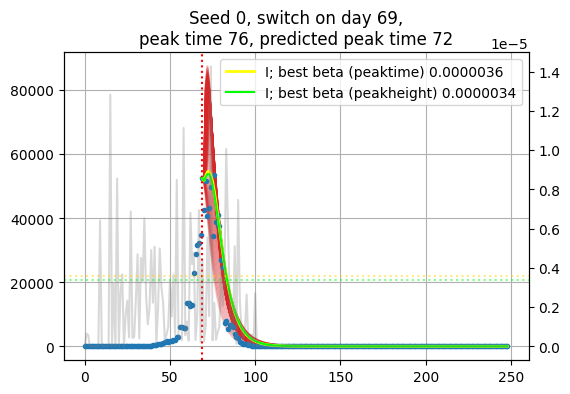

In [12]:
r = switch.constant_betas(seed=0, days_before=7)

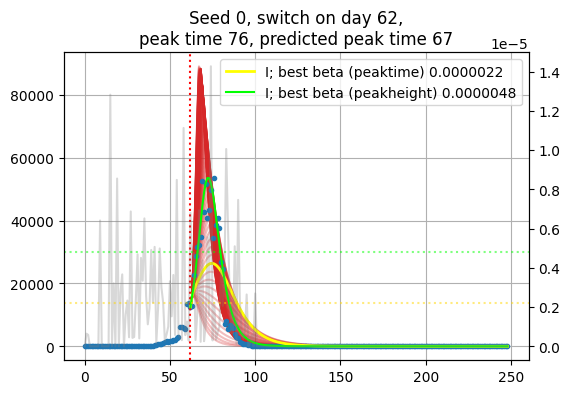

In [11]:
r = switch.constant_betas(seed=0, days_before=14)

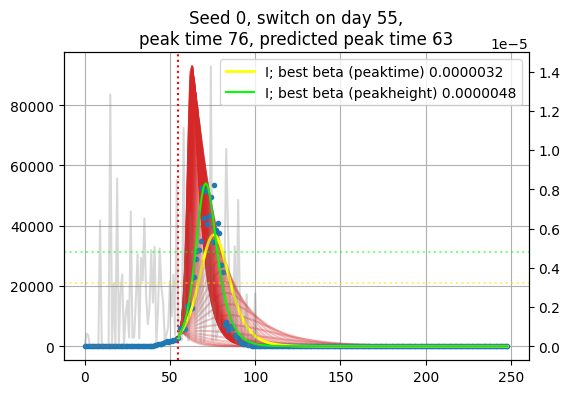

In [13]:
r = switch.constant_betas(seed=0, days_before=21)

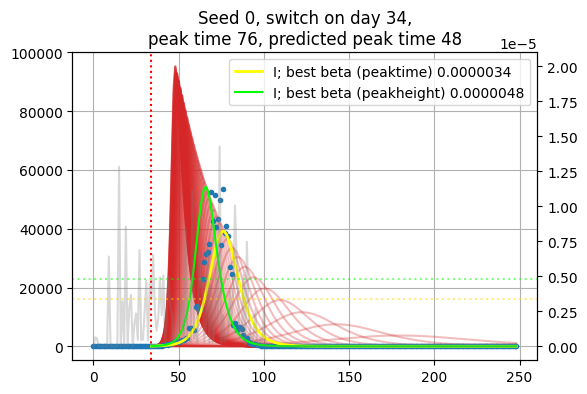

In [53]:
switch.constant_betas(seed=0, days_before=42)

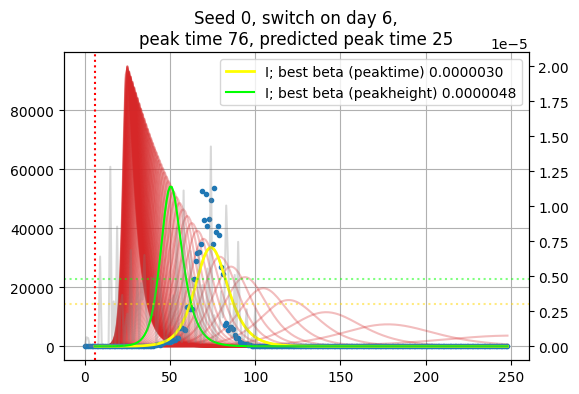

In [54]:
switch.constant_betas(seed=0, days_before=70)

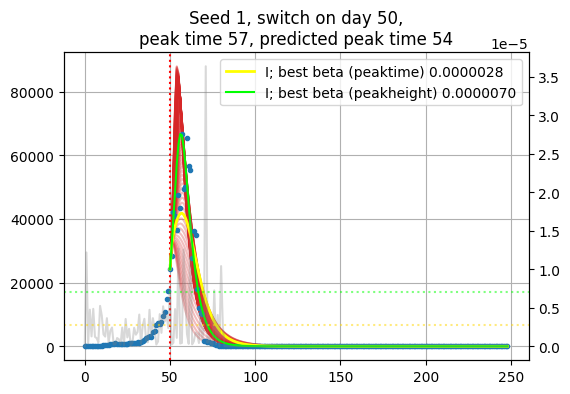

In [55]:
switch.constant_betas(seed=1, days_before=7)

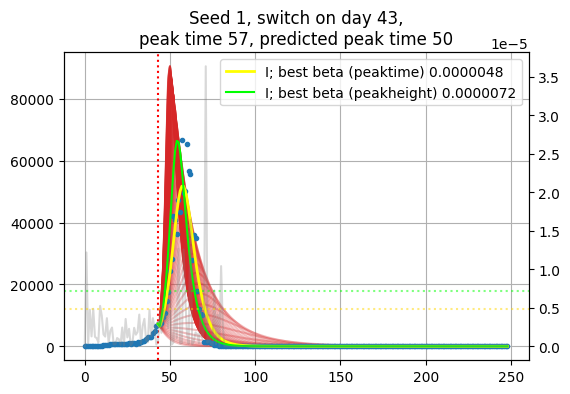

In [56]:
switch.constant_betas(seed=1, days_before=14)

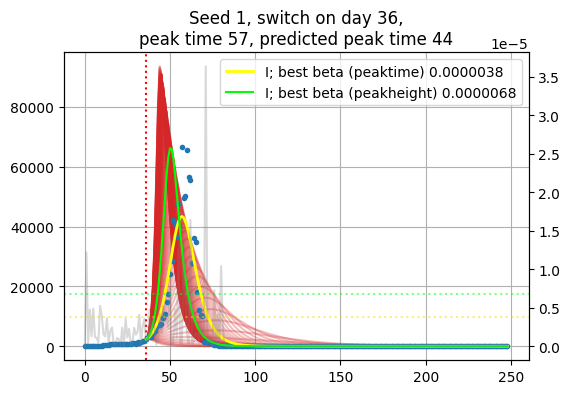

In [57]:
switch.constant_betas(seed=1, days_before=21)

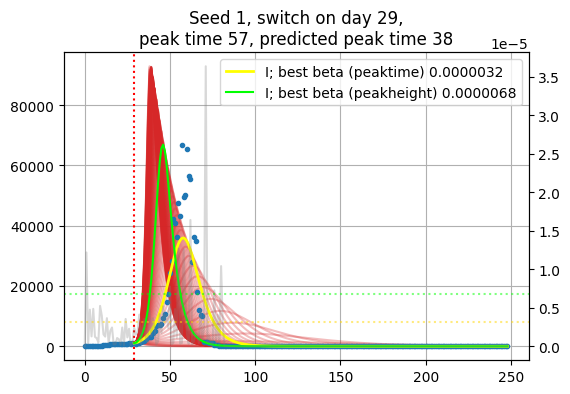

In [8]:
res = switch.constant_betas(seed=1, days_before=28, plot=True)

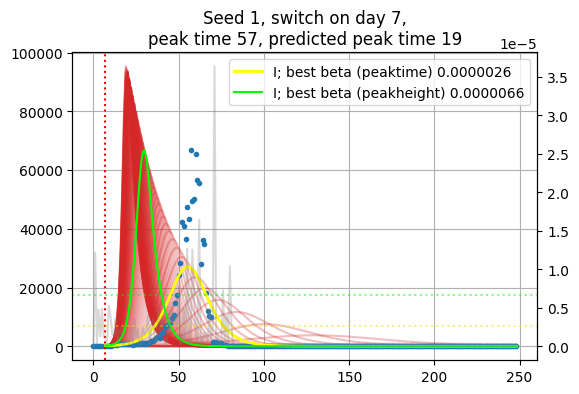

In [12]:
res = switch.constant_betas(seed=1, days_before=50, plot=True)

In [98]:
betas, best_b, best_b_peak_time, best_b_peak_h = res
best_b.columns = ['beta', 'rmse_pt', 'rmse_ph']
best_b

,beta,rmse_pt,rmse_ph
0,0.000000e+00,27.0,65504.666667
1,2.000000e-07,27.0,65504.666667
2,4.000000e-07,27.0,65504.666667
3,6.000000e-07,27.0,65504.666667
4,8.000000e-07,27.0,65504.666667
...,...,...,...
96,1.920000e-05,18.0,25760.438193
97,1.940000e-05,18.0,25605.651509
98,1.960000e-05,18.0,25423.666209
99,1.980000e-05,19.0,25723.736943


In [121]:
col = 'rmse_pt'
beta_part = best_b.nsmallest(1,col)
beta1_pt = [beta_part['beta'].values[0], beta_part[col].values[0]]

col = 'rmse_ph'
beta_part = best_b.nsmallest(1,col)
beta1_ph = [beta_part['beta'].values[0], beta_part[col].values[0]]

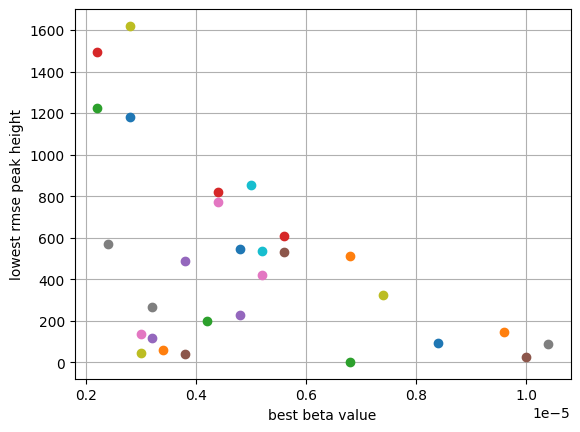

In [136]:
all_res = []
for seed in np.arange(30):
    if seed != 6:
        res = switch.constant_betas(seed=seed, days_before=21, plot=False)
        betas, real_peakt, best_b, best_b_peak_time, best_b_peak_h = res
        all_res.append(res)
        best_b.columns = ['beta', 'rmse_pt', 'rmse_ph']
        col = 'rmse_ph'
        beta_part = best_b.nsmallest(1,col)
        beta1_ph = [beta_part['beta'].values[0], beta_part[col].values[0]]
        plt.plot(beta1_ph[0], beta1_ph[1], ls='', marker='o')
        
plt.xlabel('best beta value')
plt.ylabel('lowest rmse peak height')
plt.grid()

In [ ]:
# мб максимальное значение реальных бет?

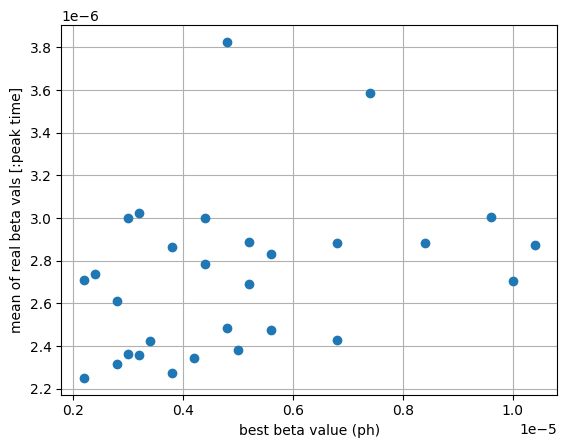

In [156]:
plt.plot([i[-1] for i in all_res],
         [i[0][:i[1]].mean() for i in all_res], 
         ls='', marker='o')
plt.xlabel('best beta value (ph)')
plt.ylabel('mean of real beta vals [:peak time]')

plt.grid()

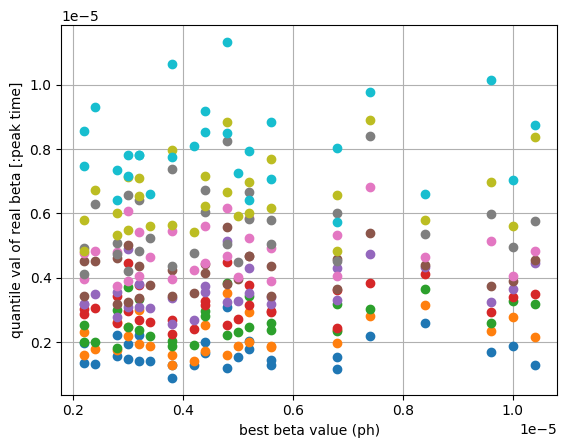

In [191]:
x = [i[-1] for i in all_res]

for q in np.arange(0.5, 0.99, 0.05):
    y = [i[0][:i[1]].quantile(q) for i in all_res]
    plt.plot(x,y, ls='', marker='o')
    
plt.xlabel('best beta value (ph)')
plt.ylabel('quantile val of real beta [:peak time]')

plt.grid()

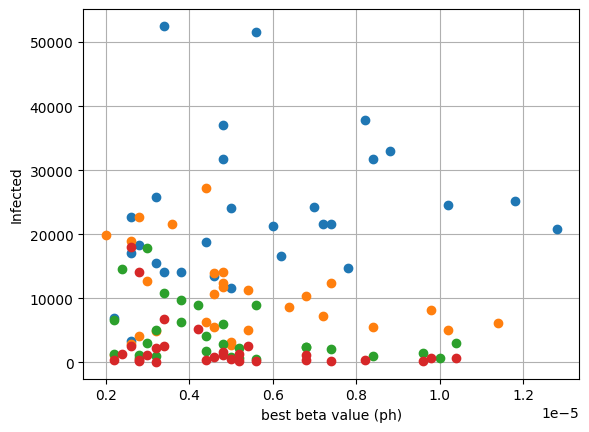

In [216]:
all_x, all_y = [], []

for days in [7, 14, 21, 28]:
    all_res = []
    for seed in np.arange(30):
        if seed != 6:
            res = switch.constant_betas(seed=seed, days_before=days, plot=False)
            betas, real_peakt, Inf, best_b, best_b_peak_time, best_b_peak_h = res
            all_res.append(res)
            best_b.columns = ['beta', 'rmse_pt', 'rmse_ph']
            col = 'rmse_ph'
            beta_part = best_b.nsmallest(1,col)
            beta1_ph = [beta_part['beta'].values[0], beta_part[col].values[0]]
            #plt.plot(beta1_ph[0], beta1_ph[1], ls='', marker='o')

    x = [i[-1] for i in all_res]
    y = [i[2] for i in all_res]
    all_x.append(x)
    all_y.append(y)
    plt.plot(x,y, 
             ls='', marker='o')

plt.xlabel('best beta value (ph)')
plt.ylabel('Infected')

plt.grid()

In [218]:
np.log(Inf)

5.420534999272286

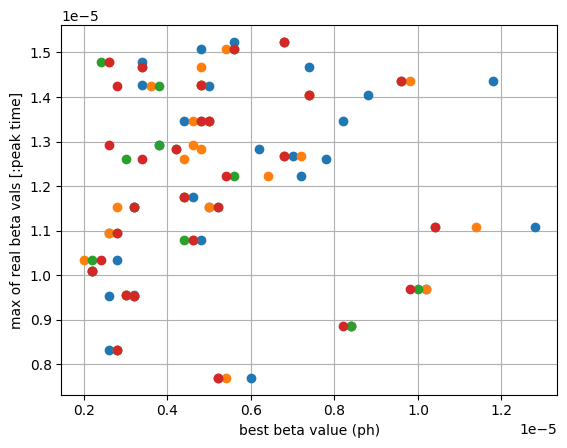

In [210]:
all_x, all_y = [], []

for days in [7, 14, 21, 28]:
    all_res = []
    for seed in np.arange(30):
        if seed != 6:
            res = switch.constant_betas(seed=seed, days_before=days, plot=False)
            betas, real_peakt, Inf, best_b, best_b_peak_time, best_b_peak_h = res
            all_res.append(res)
            best_b.columns = ['beta', 'rmse_pt', 'rmse_ph']
            col = 'rmse_ph'
            beta_part = best_b.nsmallest(1,col)
            beta1_ph = [beta_part['beta'].values[0], beta_part[col].values[0]]
            #plt.plot(beta1_ph[0], beta1_ph[1], ls='', marker='o')

    x = [i[-1] for i in all_res]
    y = [i[0][:i[1]].max() for i in all_res]
    all_x.append(x)
    all_y.append(y)
    plt.plot(x,y, 
             ls='', marker='o')

plt.xlabel('best beta value (ph)')
plt.ylabel('max of real beta vals [:peak time]')

plt.grid()

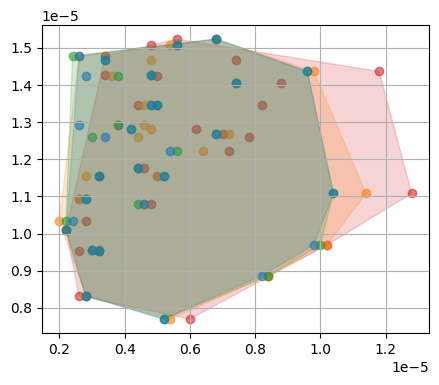

In [208]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))
colors = ['tab:red','tab:orange','tab:green', 'tab:blue']

for x, y, color in zip(all_x, all_y, colors):
    x = pd.Series(x)
    y = pd.Series(y)
    ax.scatter(x, y, color=color, alpha = 0.6)

    hull = ConvexHull(pd.concat([x,y], axis=1))
    ax.fill(x.iloc[hull.vertices], 
                 y.iloc[hull.vertices], alpha=0.2, color=color)

ax.grid()

In [ ]:
'''
при сдвиге дня переключения
красная форма одинаковая. иногда меняется макс.высота

можно ли по начальным дням понять, какая бета будет лучшей?..

'''

### chelyabinsk constant

(-2.0, 60.0)

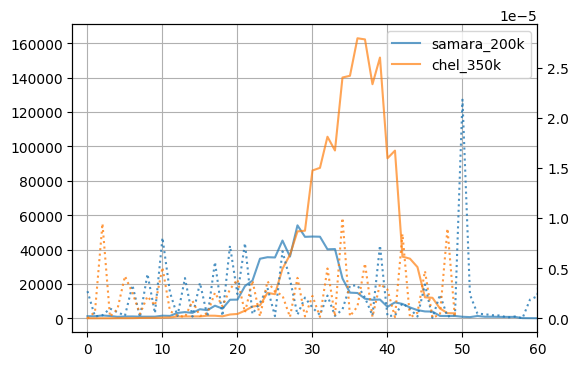

In [23]:
'''
у Челябинска более острые пики? мб потому что населения больше
'''

df_b1 = pd.read_csv(f'sampled_200k_res_recalc/seirb_seed_{20}.csv').shift(-30)
df_b = pd.read_csv(f'full_chel_recalc/seirb_seed_{0}.csv')
#df_b10 = pd.read_csv(f'chelyabinsk_10_res_10i_recalc/seirb_seed_{0}.csv')

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_b = ax.twinx()

ax.plot(df_b1.I_H1N1, color='tab:blue', alpha=0.7, label='samara_200k')
ax.plot(df_b.I_H1N1, color='tab:orange', alpha=0.7, label='chel_350k')
#ax.plot(df_b10.I_H1N1, color='tab:red', alpha=0.7, label='chel_350k_10i')

ax_b.plot(df_b1.beta_H1N1, color='tab:blue', ls=':',alpha=0.8)
ax_b.plot(df_b.beta_H1N1, color='tab:orange', ls=':',alpha=0.8)
#ax_b.plot(df_b10.beta_H1N1, color='black', alpha=0.3, ls=':')

ax.grid()
ax.legend()
ax.set_xlim(-2,60)

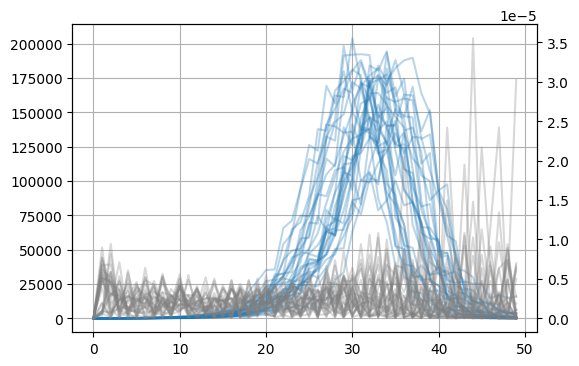

In [43]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_b = ax.twinx()
for i in range(30):
    df = pd.read_csv(f'full_chel_recalc/seirb_seed_{i}.csv')
    ax.plot(df.I_H1N1, color='tab:blue', alpha=0.3)
    ax_b.plot(df.beta_H1N1, color='gray', alpha=0.3)

ax.grid()

In [25]:
from scipy.optimize import curve_fit

In [26]:
def biexponential_decay_func(x,a,b,c): 
    return a*(np.exp(-b*x)- np.exp(-c*x))



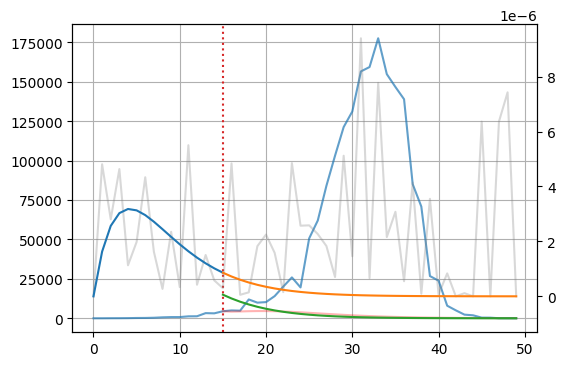

In [29]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_b = ax.twinx()

i = 2
df_b = pd.read_csv(f'full_chel_recalc/seirb_seed_{i}.csv')
ax.plot(df_b.I_H1N1, color='tab:blue', alpha=0.7)
ax_b.plot(df_b.beta_H1N1, color='gray', alpha=0.3)

fin = df_b.shape[0]
st_day = 15
ax.axvline(st_day, ls=':',color='tab:red')

coeffs, _ = curve_fit(biexponential_decay_func, np.arange(1,1+st_day), 
                      df_b.beta_H1N1.iloc[:st_day])

beggining_beta = biexponential_decay_func(np.arange(0,1+st_day), *coeffs)
ax_b.plot(beggining_beta)

pred_beta = biexponential_decay_func(np.arange(st_day, fin), *coeffs)
ax_b.plot(np.arange(st_day, fin), pred_beta)

y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)
sigma = 1/2
gamma = 1/6

xx = 0.8e-6
ax_b.plot(np.arange(st_day, fin), pred_beta-xx)
S,E,I,R = seir_discrete.seir_model(y0, ts, pred_beta,
                                   sigma, gamma, stype='d', 
                                   beta_t=True).T
ax.plot(ts+st_day, I, color='red', ls='-', alpha=0.3)
    
ax.grid()

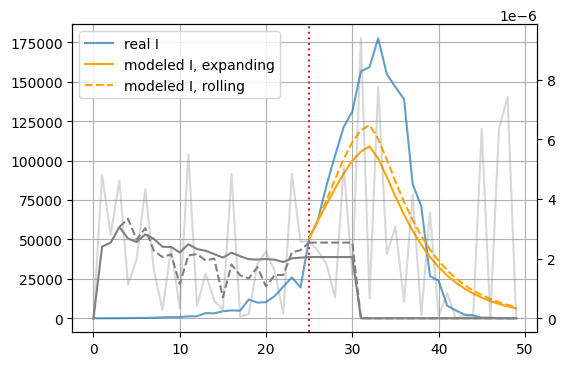

In [39]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_b = ax.twinx()

i = 2
df_b = pd.read_csv(f'full_chel_recalc/seirb_seed_{i}.csv')
ax.plot(df_b.I_H1N1, color='tab:blue', alpha=0.7, label='real I')
ax_b.plot(df_b.beta_H1N1, color='gray', alpha=0.3)

fin = df_b.shape[0]
st_day = 25
ax.axvline(st_day, ls=':',color='tab:red')


y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)
sigma = 1/2
gamma = 1/6

pred_days = fin-st_day
large_days = 6
rest_days = pred_days-large_days

beta_exp = df_b.beta_H1N1.expanding().mean()
ax_b.plot(beta_exp.iloc[:st_day+1], color='gray')

bb = [*[beta_exp.iloc[st_day]]*large_days, 
      *[0]*rest_days]
ax_b.plot(np.arange(st_day, fin), bb, color='gray')
S,E,I,R = seir_discrete.seir_model(y0, ts, bb,
                                   sigma, gamma, stype='d', 
                                   beta_t=True).T
ax.plot(ts+st_day, I, color='orange', ls='-', alpha=1, label='modeled I, expanding')


beta_roll = df_b.beta_H1N1.rolling(4).mean()
ax_b.plot(beta_roll.iloc[:st_day+1], color='gray', ls='--')

bb = [*[beta_roll.iloc[st_day]]*large_days, 
      *[0]*rest_days]
ax_b.plot(np.arange(st_day, fin), bb, color='gray', ls='--')
S,E,I,R = seir_discrete.seir_model(y0, ts, bb,
                                   sigma, gamma, stype='d', 
                                   beta_t=True).T
ax.plot(ts+st_day, I, color='orange', ls='--', alpha=1, label='modeled I, rolling')

ax.grid()
ax.legend()

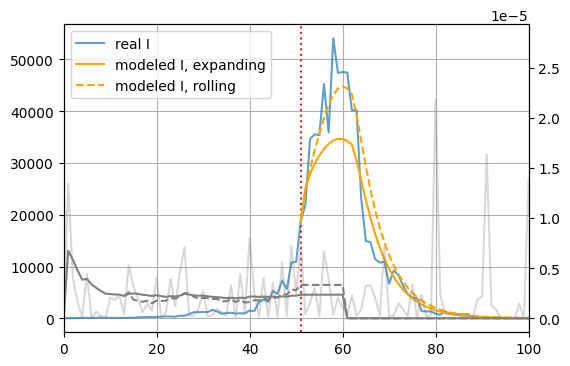

In [331]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_b = ax.twinx()

i = 20
df_b = pd.read_csv(f'sampled_200k_res_recalc/seirb_seed_{i}.csv')
ax.plot(df_b.I_H1N1, color='tab:blue', alpha=0.7, label='real I')
ax_b.plot(df_b.beta_H1N1, color='gray', alpha=0.3)

fin = df_b.shape[0]
st_day = 51
ax.axvline(st_day, ls=':',color='tab:red')


y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)
sigma = 1/2
gamma = 1/6

pred_days = fin-st_day
large_days = 10
rest_days = pred_days-large_days

beta_exp = df_b.beta_H1N1.expanding().mean()
ax_b.plot(beta_exp.iloc[:st_day+1], color='gray')

bb = [*[beta_exp.iloc[st_day]]*large_days, 
      *[0]*rest_days]
ax_b.plot(np.arange(st_day, fin), bb, color='gray')
S,E,I,R = seir_discrete.seir_model(y0, ts, bb,
                                   sigma, gamma, stype='d', 
                                   beta_t=True).T
ax.plot(ts+st_day, I, color='orange', ls='-', alpha=1, label='modeled I, expanding')


beta_roll = df_b.beta_H1N1.rolling(14).mean()
ax_b.plot(beta_roll.iloc[:st_day+1], color='gray', ls='--')

bb = [*[beta_roll.iloc[st_day]]*large_days, 
      *[0]*rest_days]
ax_b.plot(np.arange(st_day, fin), bb, color='gray', ls='--')
S,E,I,R = seir_discrete.seir_model(y0, ts, bb,
                                   sigma, gamma, stype='d', 
                                   beta_t=True).T
ax.plot(ts+st_day, I, color='orange', ls='--', alpha=1, label='modeled I, rolling')

ax.grid()
ax.set_xlim(0, 100)
ax.legend()

In [286]:
df_b.beta_H1N1.iloc[st_day]

3.944610939560359e-06

In [267]:
fin-st_day

25

In [257]:
pred_beta

array([2.93269112e-06, 2.66708098e-06, 2.41605211e-06, 2.18107719e-06,
       1.96287790e-06, 1.76161433e-06, 1.57703485e-06, 1.40859399e-06,
       1.25554459e-06, 1.11700907e-06, 9.92034151e-07, 8.79632197e-07,
       7.78812097e-07, 6.88601732e-07, 6.08063916e-07, 5.36307220e-07,
       4.72492847e-07, 4.15838482e-07, 3.65619873e-07, 3.21170706e-07,
       2.81881263e-07, 2.47196217e-07, 2.16611843e-07, 1.89672874e-07,
       1.65969158e-07])

In [207]:
coeffs

array([0.91640798, 0.15947322, 0.15947555])

In [122]:
biexponential_decay_func(np.arange(1,1+st_day), *coeffs)

array([2.01732244e-06, 3.37950424e-06, 4.24611677e-06, 4.74218344e-06,
       4.96519194e-06, 4.99074025e-06, 4.87707502e-06, 4.66873326e-06,
       4.39945889e-06, 4.09453355e-06, 3.77263508e-06, 3.44731555e-06,
       3.12817344e-06, 2.82178023e-06, 2.53241041e-06, 2.26261412e-06,
       2.01366448e-06, 1.78590508e-06, 1.57901825e-06, 1.39223075e-06,
       1.22447015e-06, 1.07448230e-06, 9.40918702e-07, 8.22400160e-07,
       7.17562331e-07])

In [121]:
coeffs

array([0.81638775, 0.17718779, 0.17719074])

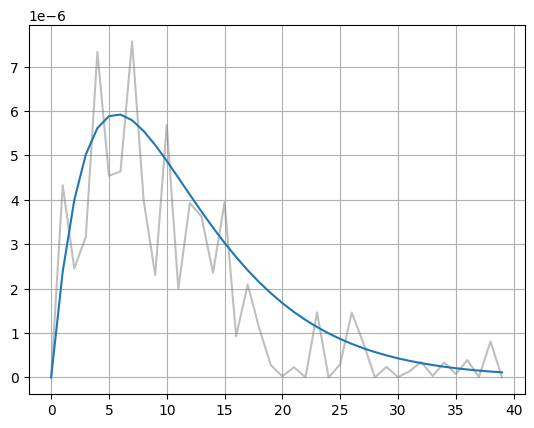

In [225]:
plt.plot(df_b.beta_H1N1, color='gray', alpha=0.5)
plt.plot(biexponential_decay_func(np.arange(fin),
                                  0.99638775, 0.17618789, 0.17619074))
plt.grid()

(20.0, 70.0)

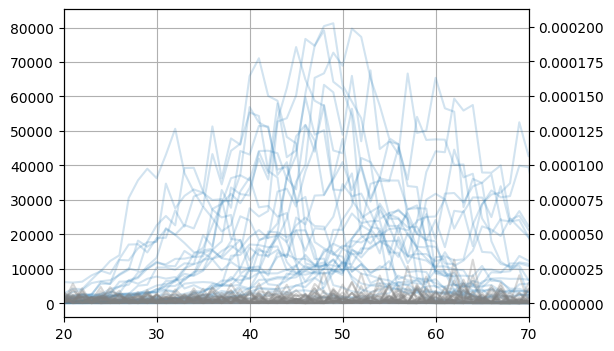

In [91]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_b = ax.twinx()
for i in range(30):
    df = pd.read_csv(f'sampled_200k_res_recalc/seirb_seed_{i}.csv')
    ax.plot(df.I_H1N1, color='tab:blue', alpha=0.2)
    ax_b.plot(df.beta_H1N1, color='gray', alpha=0.3)

ax.grid()
ax.set_xlim(20,70)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_b = ax.twinx()
for i in range(5):
    df = pd.read_csv(f'chelyabinsk_10_res_recalc/seirb_seed_{i}.csv')
    ax.plot(df.I_H1N1, color='tab:blue', alpha=0.7)
    ax_b.plot(df.beta_H1N1, color='gray', alpha=0.3)

ax.grid()

In [158]:
def ode_model(z, t, beta, sigma, gamma):
    """
    Reference https://www.idmod.org/docs/hiv/model-seir.html
    """
    S, E, I, R = z
    N = S + E + I + R
    dSdt = -beta*S*I/N
    dEdt = beta*S*I/N - sigma*E
    dIdt = sigma*E - gamma*I
    dRdt = gamma*I
    return [dSdt, dEdt, dIdt, dRdt]

def ode_solver(t, initial_conditions, params):
    initE, initI, initR, initN = initial_conditions
    beta, sigma, gamma = params[0], params[1], params[2]
    initS = initN - (initE + initI + initR)
    res = odeint(ode_model, [initS, initE, initI, initR], t, args=(beta, sigma, gamma))
    return res

In [154]:
y0.sum()

355359.0

In [156]:
sigma, gamma

(0.5, 0.16666666666666666)

In [160]:
from scipy.integrate import odeint

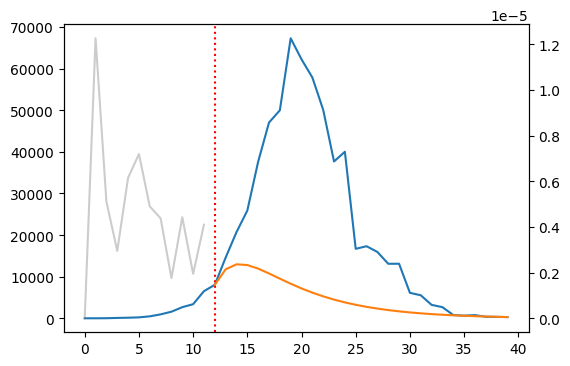

In [165]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

folder = 'chelyabinsk_10_res_recalc'
df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')
fin = df_b.shape[0]
real_peakt = df_b.I_H1N1.argmax()
real_peakh = df_b.I_H1N1.max()
st_day = real_peakt - 7
ax.plot(df_b.I_H1N1)

betas = df_b.beta_H1N1[:st_day]
ax_beta.plot(betas[:st_day], color='gray', alpha=0.4, label='beta from df')


ax.axvline(st_day, ls=':', color='red')

y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)
sigma = 1/2
gamma = 1/6

initial_conditions = [*y0[1:4], y0.sum()]
params = [2e-5, sigma, gamma]

fin = df_b.shape[0]
st_day = real_peakt - 7

tspan = np.arange(st_day, fin)
sol = ode_solver(tspan, initial_conditions, params)
S, E, I, R = sol[:, 0], sol[:, 1], sol[:, 2], sol[:, 3]

ax.plot(np.arange(st_day, fin), I)

In [45]:
from sklearn.metrics import root_mean_squared_error as rmse

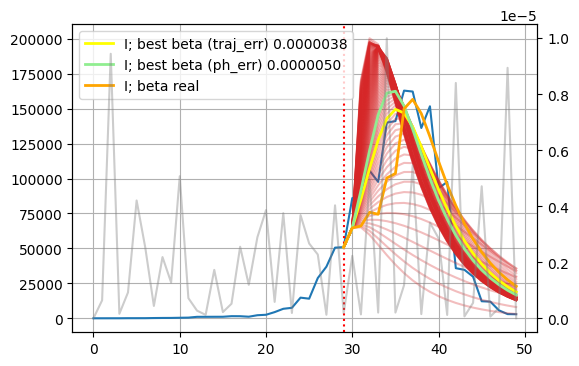

In [50]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

folder = 'full_chel_recalc/'
df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')
fin = df_b.shape[0]
real_peakt = df_b.I_H1N1.argmax()
real_peakh = df_b.I_H1N1.max()
st_day = real_peakt - 7
ax.plot(df_b.I_H1N1)

betas = df_b.beta_H1N1
ax_beta.plot(betas, color='gray', alpha=0.4, label='beta from df')


ax.axvline(st_day, ls=':', color='red')

y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)
sigma = 1/2
gamma = 1/6

res_dict = dict()
for b in np.arange(0.0, 2e-5, 2e-7):
    #ax_beta.plot(b, ls='--', color='tab:green')
    S,E,I,R = seir_discrete.seir_model(y0, ts, b, 
                                       sigma, gamma, stype='d', 
                                       beta_t=False).T
    if np.sum([S,E,I,R], 0).sum() <= 9950052:
        ax.plot(ts+st_day, I, color='tab:red', ls='-', alpha=0.3)
    else:
        ax.plot(ts+st_day, I, color='gray', ls='-', alpha=0.3)
    predicted_peakt = I.argmax()+st_day
    predicted_peakh = I.max()

    pt_err = abs(real_peakt - predicted_peakt)
    ph_err = abs(real_peakh - predicted_peakh)
    traj_err = rmse(df_b.I_H1N1.iloc[st_day:], I) 
    res_dict[b] = [pt_err,ph_err,traj_err]
    
    
    
best_b = pd.DataFrame.from_dict(res_dict).T.reset_index()
best_b.columns = ['beta', 'pt_err', 'ph_err', 'traj_err']

best_b_peak_time = best_b.nsmallest(1,'traj_err').iloc[0,0]   
S,E,Ib,R = seir_discrete.seir_model(y0, ts, best_b_peak_time, 
                                     sigma, gamma, stype='d', 
                                   beta_t=False).T
ax.plot(ts+st_day, Ib, color='yellow', ls='-', alpha=1, lw=2,
                    label=f'I; best beta (traj_err) {best_b_peak_time:.7f}')   


best_b_peak_time = best_b.nsmallest(1,'ph_err').iloc[0,0]   
S,E,Ib,R = seir_discrete.seir_model(y0, ts, best_b_peak_time, 
                                     sigma, gamma, stype='d', 
                                   beta_t=False).T
ax.plot(ts+st_day, Ib, color='lightgreen', ls='-', alpha=1, lw=2,
                    label=f'I; best beta (ph_err) {best_b_peak_time:.7f}')         


S,E,Ib,R = seir_discrete.seir_model(y0, ts, betas.iloc[st_day:].values, 
                                     sigma, gamma, stype='d', 
                                   beta_t=True).T
ax.plot(ts+st_day, Ib, color='orange', ls='-', alpha=1, lw=2,
                    label=f'I; beta real')         

ax.grid()
#ax.set_xlim(40,80)
ax.legend()

In [52]:
np.where(np.sum([S,E,Ib,R], 0) > 355359.)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20], dtype=int64),)

In [53]:
np.sum([S,E,Ib,R], 0)

array([400000.        , 400000.        , 400000.        , 400000.        ,
       400000.        , 400000.        , 400330.82083651, 400330.82083651,
       400330.82083651, 400330.82083651, 400330.82083651, 400330.82083651,
       400330.82083651, 400330.82083651, 400330.82083651, 400330.82083651,
       400330.82083651, 400330.82083651, 400330.82083651, 400330.82083651,
       400330.82083651])

In [54]:
best_b.nsmallest(5,'traj_err')

,beta,pt_err,ph_err,traj_err
19,0.000004,1.0,13383.237860,20356.725393
18,0.000004,1.0,16613.144107,20447.963087
20,0.000004,1.0,10478.537262,20484.546728
21,0.000004,1.0,7889.852956,20784.303186
17,0.000003,1.0,20175.250577,20805.493808


In [32]:
from sklearn.metrics import root_mean_squared_error as rmse

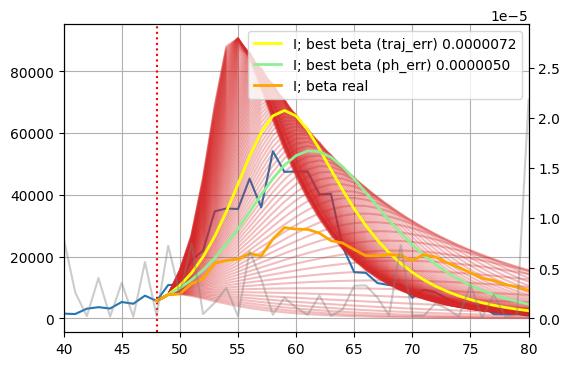

In [203]:
i=20

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

folder = 'sampled_200k_res_recalc'
#folder = 'chelyabinsk_10_res_10i_recalc'
df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')
'''
df_b = pd.concat( [pd.DataFrame([df_b.iloc[0]]*10), 
                   df_b] ).reset_index(drop=True)
'''
fin = df_b.shape[0]
real_peakt = df_b.I_H1N1.argmax()
real_peakh = df_b.I_H1N1.max()
st_day = real_peakt -10
ax.plot(df_b.I_H1N1)

betas = df_b.beta_H1N1
ax_beta.plot(betas, color='gray', alpha=0.4, label='beta from df')


ax.axvline(st_day, ls=':', color='red')

y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)
sigma = 1/2
gamma = 1/6

res_dict = dict()
for b in np.arange(0.0, 2e-5, 2e-7):
    #ax_beta.plot(b, ls='--', color='tab:green')
    S,E,I,R = seir_discrete.seir_model(y0, ts, b, 
                                       sigma, gamma, stype='d', 
                                       beta_t=False).T
    ax.plot(ts+st_day, I, color=col, ls='-', alpha=0.3)
    
    predicted_peakt = I.argmax()+st_day
    predicted_peakh = I.max()
    
    pt_err = abs(real_peakt - predicted_peakt)
    ph_err = abs(real_peakh - predicted_peakh)
    traj_err = rmse(df_b.I_H1N1.iloc[st_day:], I) 
    res_dict[b] = [pt_err,ph_err,traj_err]
    
    
best_b = pd.DataFrame.from_dict(res_dict).T.reset_index()
best_b.columns = ['beta', 'pt_err', 'ph_err', 'traj_err']

best_b_peak_time = best_b.nsmallest(1,'traj_err').iloc[0,0]   
S,E,Ib,R = seir_discrete.seir_model(y0, ts, best_b_peak_time, 
                                     sigma, gamma, stype='d', 
                                   beta_t=False).T
ax.plot(ts+st_day, Ib, color='yellow', ls='-', alpha=1, lw=2,
                    label=f'I; best beta (traj_err) {best_b_peak_time:.7f}')   


best_b_peak_time = best_b.nsmallest(1,'ph_err').iloc[0,0]   
S,E,Ib,R = seir_discrete.seir_model(y0, ts, best_b_peak_time, 
                                     sigma, gamma, stype='d', 
                                   beta_t=False).T
ax.plot(ts+st_day, Ib, color='lightgreen', ls='-', alpha=1, lw=2,
                    label=f'I; best beta (ph_err) {best_b_peak_time:.7f}')         

S,E,Ib,R = seir_discrete.seir_model(y0, ts, betas.iloc[st_day:].values, 
                                     sigma, gamma, stype='d', 
                                   beta_t=True).T
ax.plot(ts+st_day, Ib, color='orange', ls='-', alpha=1, lw=2,
                    label=f'I; beta real ')         

ax.grid()
ax.set_xlim(40,80)
ax.legend()

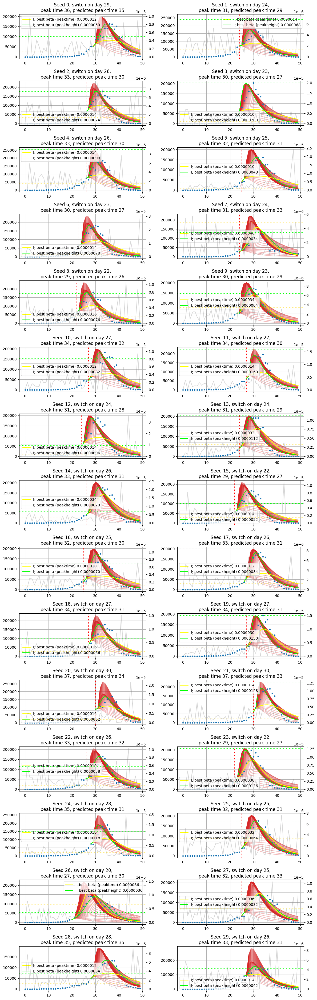

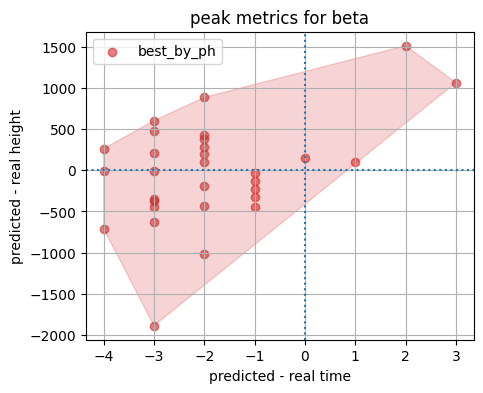

In [56]:
switch.constant_betas_all(days_before=7, sigma=1/2, gamma=1/6,
                         folder = 'full_chel_recalc', 
                          n_seeds=30)

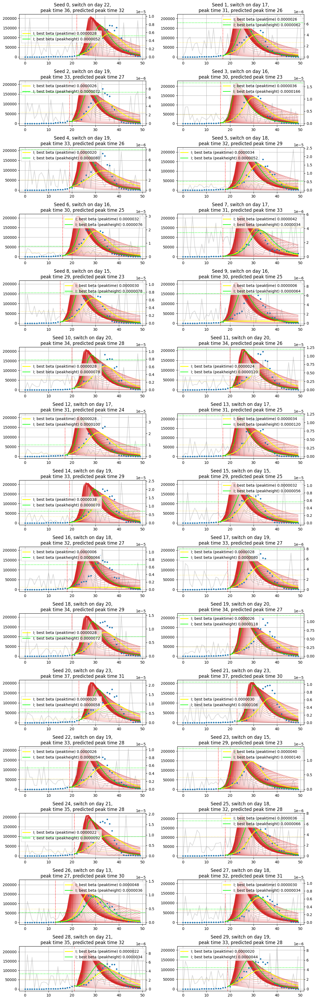

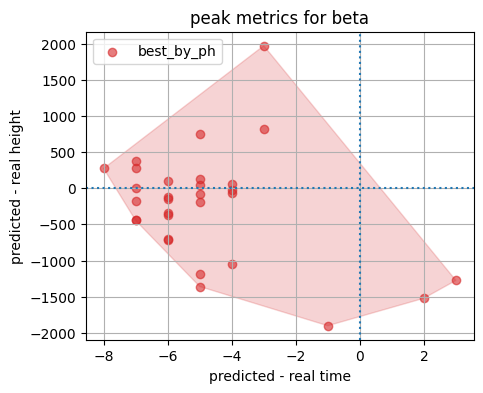

In [57]:
switch.constant_betas_all(days_before=14, sigma=1/2, gamma=1/6,
                         folder = 'full_chel_recalc', 
                          n_seeds=30)

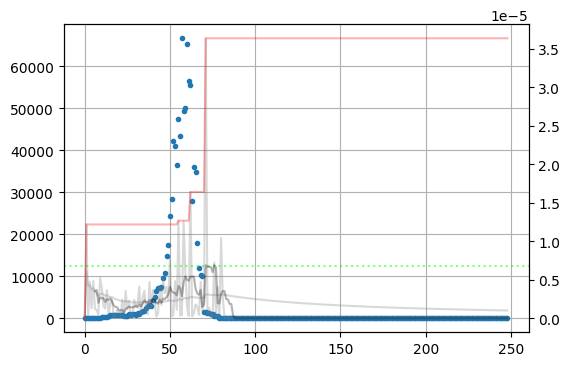

In [157]:
folder = 'sampled_200k_res_recalc'
seed = 1
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()
df_b = pd.read_csv(f'{folder}/seirb_seed_{seed}.csv')

betas = df_b.beta_H1N1
ax.plot(df_b.I_H1N1, color='tab:blue', marker='.', ls='')
ax_beta.plot(betas, color='gray', alpha=0.3, label='beta from df')

ax_beta.axhline(6.8e-6, color='lime', ls=':', alpha=0.5)

ax_beta.plot(betas.expanding(1).mean(), color='gray', 
             alpha=0.3)
ax_beta.plot(betas.rolling(7).mean(), color='black', 
             alpha=0.3)
ax_beta.plot(betas.expanding(1).max(), color='red', 
             alpha=0.3)
ax.grid()

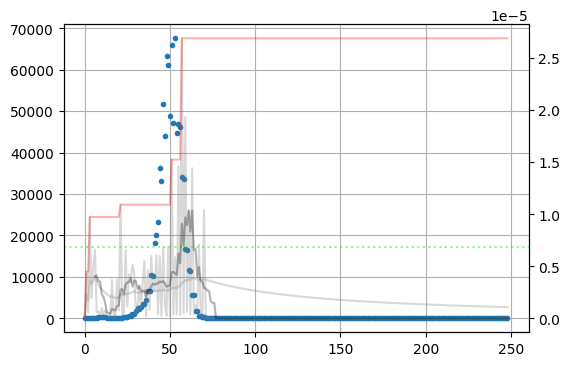

In [151]:
folder = 'sampled_200k_res_recalc'
seed = 2
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()
df_b = pd.read_csv(f'{folder}/seirb_seed_{seed}.csv')

betas = df_b.beta_H1N1
ax.plot(df_b.I_H1N1, color='tab:blue', marker='.', ls='')
ax_beta.plot(betas, color='gray', alpha=0.3, label='beta from df')

ax_beta.axhline(6.8e-6, color='lime', ls=':', alpha=0.5)

ax_beta.plot(betas.expanding(1).mean(), color='gray', 
             alpha=0.3)
ax_beta.plot(betas.rolling(7).mean(), color='black', 
             alpha=0.3)
ax_beta.plot(betas.expanding(1).max(), color='red', 
             alpha=0.3)
ax.grid()

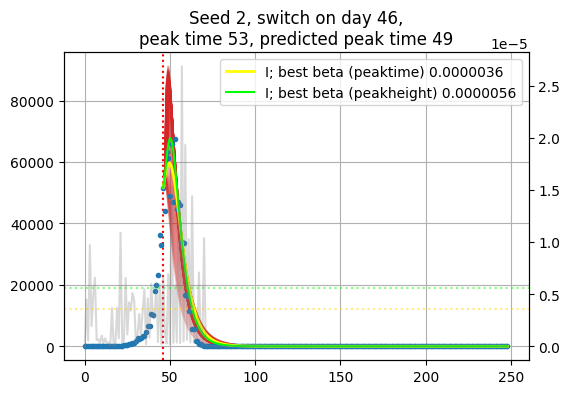

In [59]:
switch.constant_betas(seed=2, days_before=7)

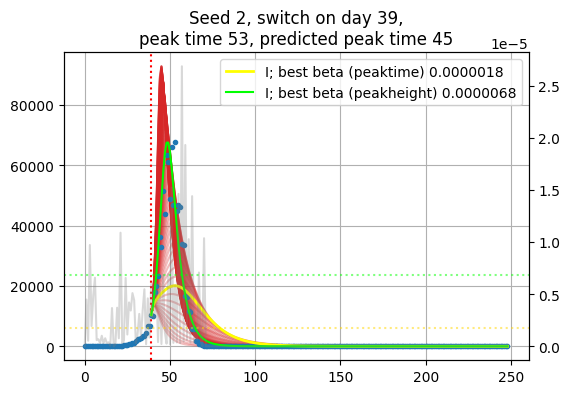

In [60]:
switch.constant_betas(seed=2, days_before=14)

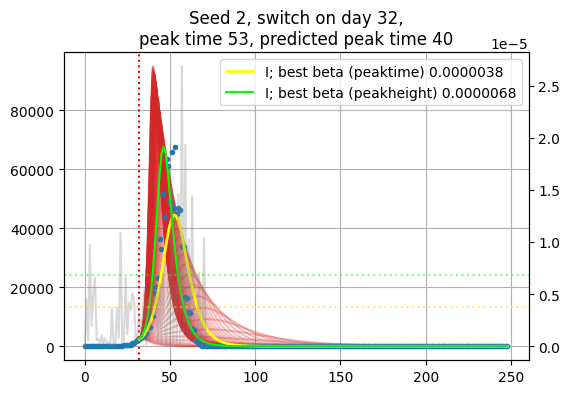

In [61]:
switch.constant_betas(seed=2, days_before=21)

<Axes: >

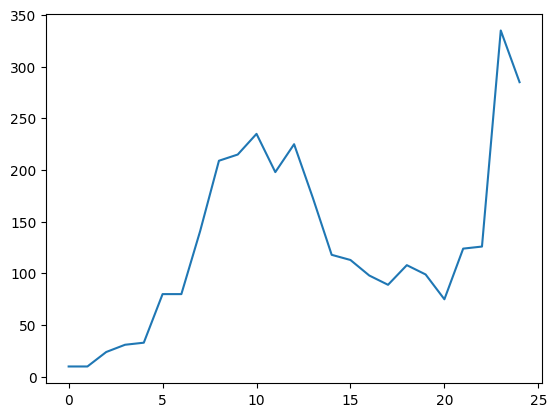

In [222]:
df_b = pd.read_csv(f'{folder}/seirb_seed_{2}.csv')
df_b.I_H1N1.iloc[:25].plot()

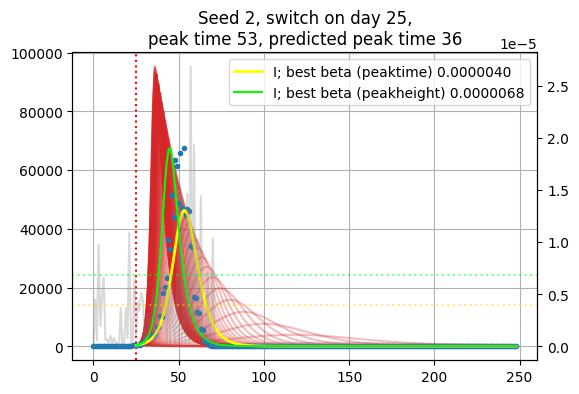

In [62]:
switch.constant_betas(seed=2, days_before=28)

## trying Chowell's uncertainty 

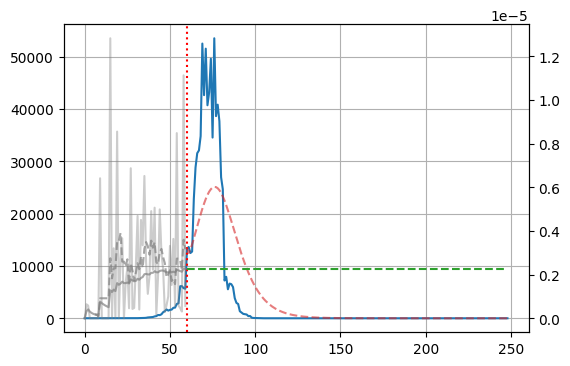

In [398]:
i=0

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax_beta = ax.twinx()

df_b = pd.read_csv(f'{folder}/seirb_seed_{i}.csv')


fin = df_b.shape[0]
st_day = 60
ax.plot(df_b.I_H1N1)

betas = df_b.beta_H1N1[:st_day]
beta_exp = betas[:st_day].expanding().mean()
beta_roll = betas[:st_day].rolling(7).mean()

ax_beta.plot(betas[:st_day], color='gray', alpha=0.4, label='beta from df')
ax_beta.plot(beta_exp, color='gray',  label='beta exp', alpha=0.7)
ax_beta.plot(beta_roll, color='gray',  label='beta roll', alpha=0.7, ls='--')



ax.axvline(st_day, ls=':', color='red')

y0 = df_b.iloc[st_day,:4].values
ts = np.arange(fin-st_day)

beta_val = beta_exp.values[-1]
col = 'tab:red'
lab = 'SEIR I (exp.mean beta)'

ax_beta.plot(np.arange(st_day,fin), [beta_val for i in range(fin-st_day)], 
             ls='--', color='tab:green')
S,E,I,R = seir_discrete.seir_model(y0, ts, beta_val, 
                                   sigma, gamma, stype='d', 
                                   beta_t=False).T

ax.plot(ts+st_day, I, color=col, ls='--', alpha=0.6, label=lab)
                    
                 
ax.grid()

In [234]:
cum_curve = pd.Series(I).expanding().sum().reset_index(drop=True)
cum_curve

0       13363.000000
1       25856.833333
2       38979.184038
3       53112.346530
4       68369.576277
           ...      
184    767723.381946
185    767723.383188
186    767723.384303
187    767723.385305
188    767723.386206
Length: 189, dtype: float64

In [286]:
pd.Series(I).mean(), pd.Series(I).var()

(4062.028498444404, 57412113.925969236)

In [285]:
cum_curve.mean(), cum_curve.var()

(684796.0319159906, 34641091469.896805)

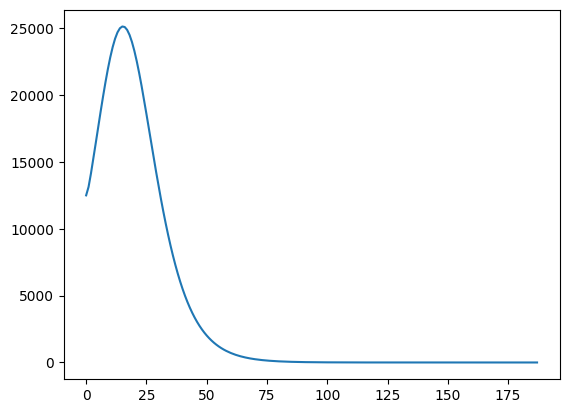

In [276]:
diffs = cum_curve[1:].values - cum_curve[:-1].values
plt.plot(diffs)

In [280]:
rng = np.random.default_rng()

all_sim_I = []
for i in range(150):
    one_sim_I = []
    for one_diff in diffs:
        lam, size = one_diff, 1
        one_sim_I.append(rng.poisson(lam=lam, size=size))
    one_sim_I = np.array(one_sim_I).flatten()
    all_sim_I.append(one_sim_I)

(0.0, 50.0)

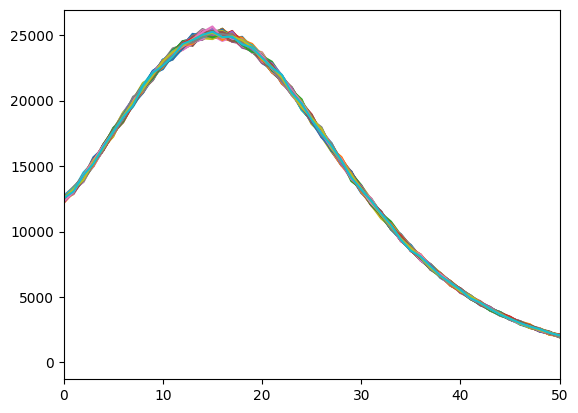

In [281]:
plt.plot(np.array(all_sim_I).T);
plt.xlim(0,50)

In [390]:
rng = np.random.default_rng()

# число неудач, произошедших до того, как набралось <n> успехов
# n successes, p probability of success
rng.negative_binomial(15000, 0.1, 10)

array([133452, 133583, 134195, 135903, 134294, 134855, 134117, 134372,
       134685, 134372], dtype=int64)

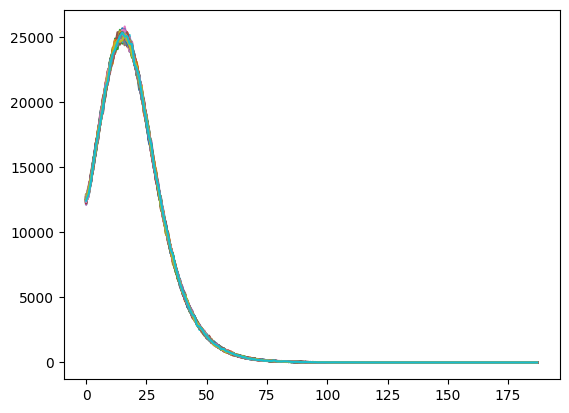

In [391]:
rng = np.random.default_rng()
all_sim_I = []
for i in range(150):
    one_sim_I = []
    for one_diff in diffs:
        one_sim_I.append(rng.negative_binomial(n=one_diff, p=0.5))
    one_sim_I = np.array(one_sim_I).flatten()
    all_sim_I.append(one_sim_I)

plt.plot(np.array(all_sim_I).T);
#plt.xlim(0,50)